In [1]:
pip install -U --pre segmentation-models

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 KB 5.9 MB/s eta 0:00:00


In [2]:
%env SM_FRAMEWORK=tf.keras

env: SM_FRAMEWORK=tf.keras


In [3]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
from PIL import Image, ImageColor, ImageFont, ImageDraw
import matplotlib.pyplot as plt
import random
import cv2

import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [12]:
def load_images(size=(224, 224)):
  imgs = []
  for img_suffix in range(1, 12):
    img = Image.open('drive/MyDrive/TIES4911/task5/img-{}.jpg'.format(img_suffix))
    img = img.resize(size=size)
    img = np.array(img, dtype=np.uint8)
    img = np.expand_dims(img, axis=0)
    imgs.append(img)

  return imgs

In [13]:
def display_image(image):
  fig = plt.figure(figsize=(10, 15))
  plt.grid(False)
  plt.imshow(image)
  plt.show()

In [6]:
def get_colored_segmentation_image(seg_arr, n_classes):
    output_height = seg_arr.shape[0]
    output_width = seg_arr.shape[1]

    seg_img = np.zeros((output_height, output_width, 3))

    for c in range(n_classes):
        seg_arr_c = seg_arr[:, :] == c
        seg_img[:, :, 0] += ((seg_arr_c)*(class_colors[c][0])).astype('uint8')
        seg_img[:, :, 1] += ((seg_arr_c)*(class_colors[c][1])).astype('uint8')
        seg_img[:, :, 2] += ((seg_arr_c)*(class_colors[c][2])).astype('uint8')

    return seg_img

In [7]:
def overlay_seg_image(inp_img, seg_img):
    fused_img = (inp_img/2 + seg_img/2).astype('uint8')
    return fused_img

In [8]:
def visualize_segmentation(seg_arr, inp_img, n_classes):
  seg_img = get_colored_segmentation_image(seg_arr, n_classes)

  original_h = inp_img.shape[0]
  original_w = inp_img.shape[1]
  seg_img = cv2.resize(seg_img, (original_w, original_h), interpolation=cv2.INTER_NEAREST)

  seg_img = overlay_seg_image(inp_img, seg_img)

  return seg_img

In [9]:
class_colors = [(random.randint(0, 255), random.randint(
    0, 255), random.randint(0, 255)) for _ in range(5000)]

In [10]:
batch = load_images((256, 256))
model = sm.Unet('mobilenetv2', encoder_weights='imagenet', input_shape=(256, 256, 3))

n_classes = model.output_shape[3]
preprocess_input = sm.get_preprocessing('mobilenetv2')

/usr/local/lib/python3.9/dist-packages/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


9406464/9406464 [==============================] - 0s 0us/step


In [12]:
for orig_img in batch:
  display_image(orig_img[0])
  img = preprocess_input(orig_img)
  pred = model.predict(img)
  display_image(tf.image.convert_image_dtype(pred, np.uint8)[0])

Output hidden; open in https://colab.research.google.com to view.

In [61]:
a = pred[0]
pr = a.reshape((model.output_shape[1],  model.output_shape[2], model.output_shape[3])).argmax(axis=2)

print(np.max(pr[0]))

0


58889256/58889256 [==============================] - 0s 0us/step
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 192, 192, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 192, 192, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 192, 192, 64  36928       ['block1_conv1[0][0]']           
                           

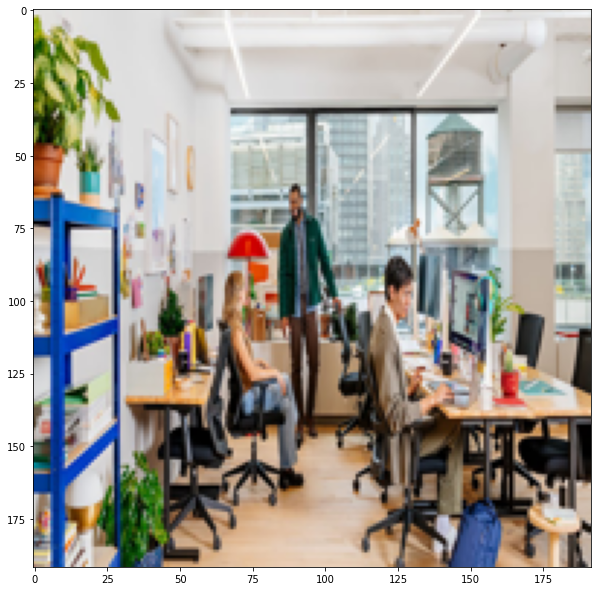

1/1 [==============================] - 3s 3s/step
20


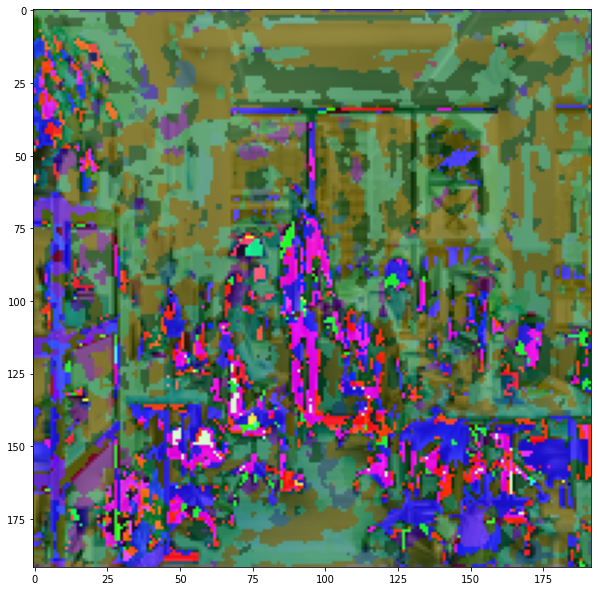

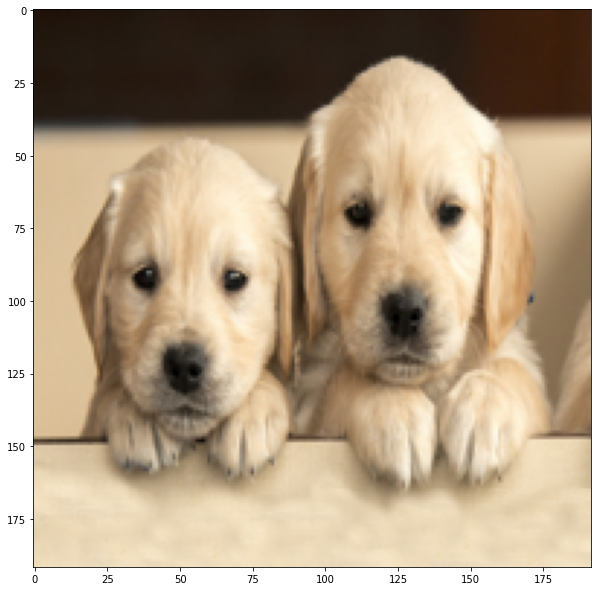

1/1 [==============================] - 1s 868ms/step
20


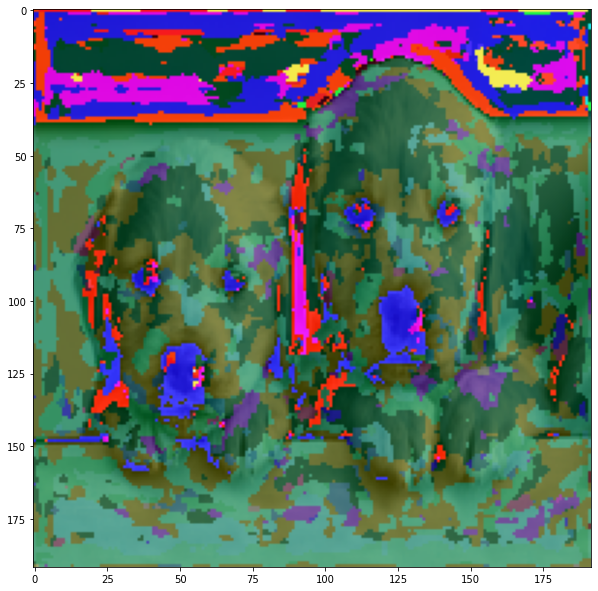

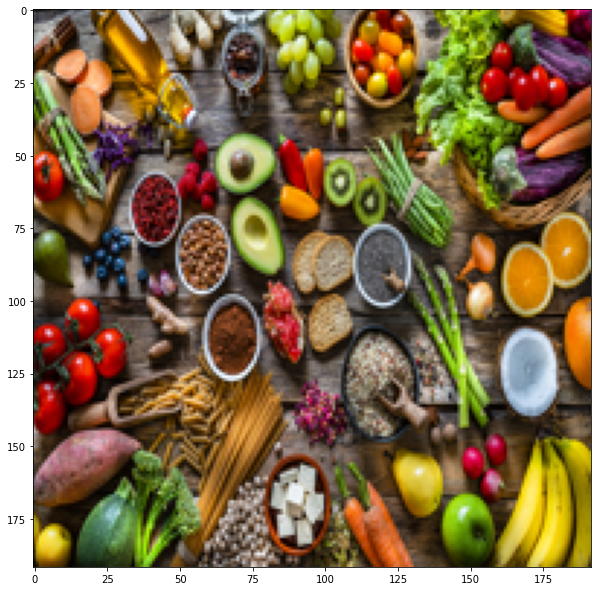

1/1 [==============================] - 1s 862ms/step
20


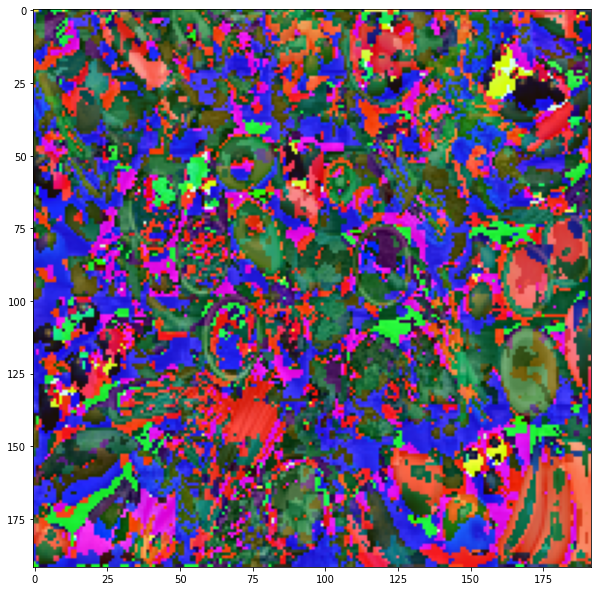

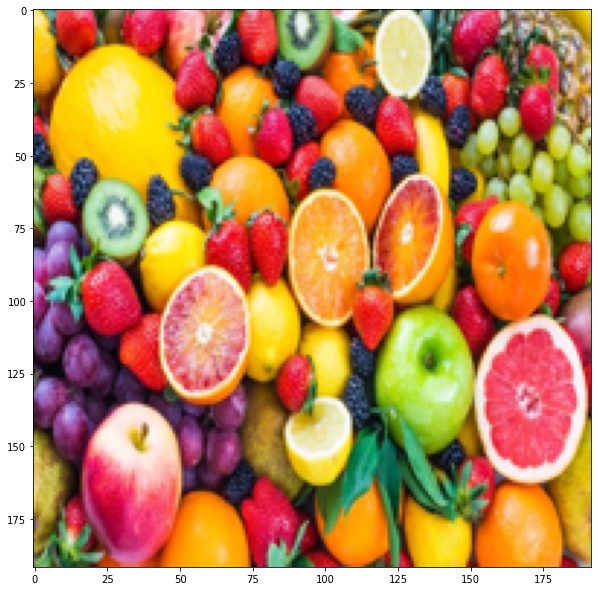

1/1 [==============================] - 1s 961ms/step
20


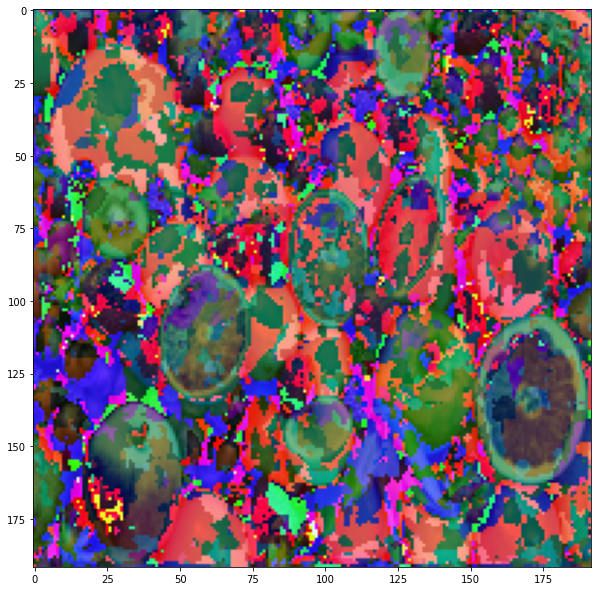

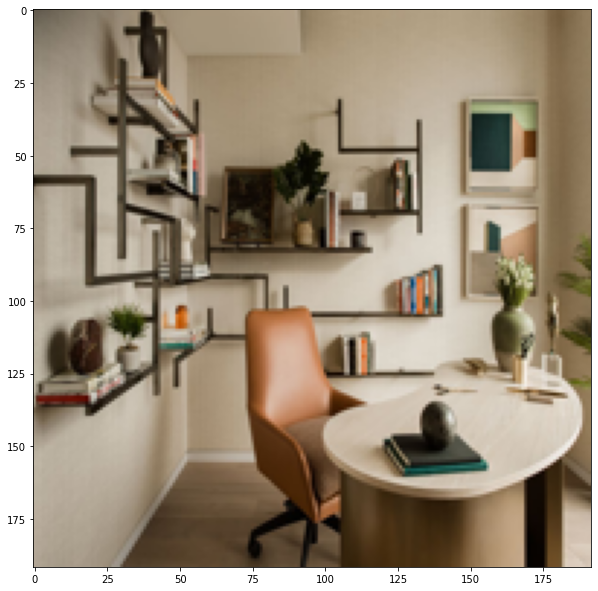

1/1 [==============================] - 1s 866ms/step
20


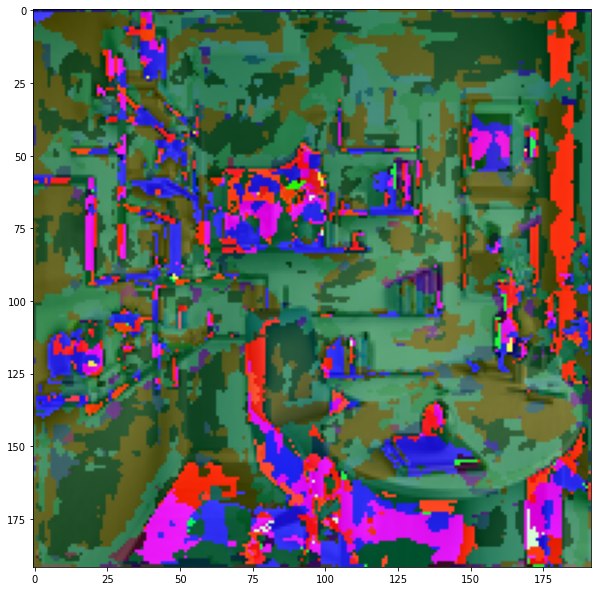

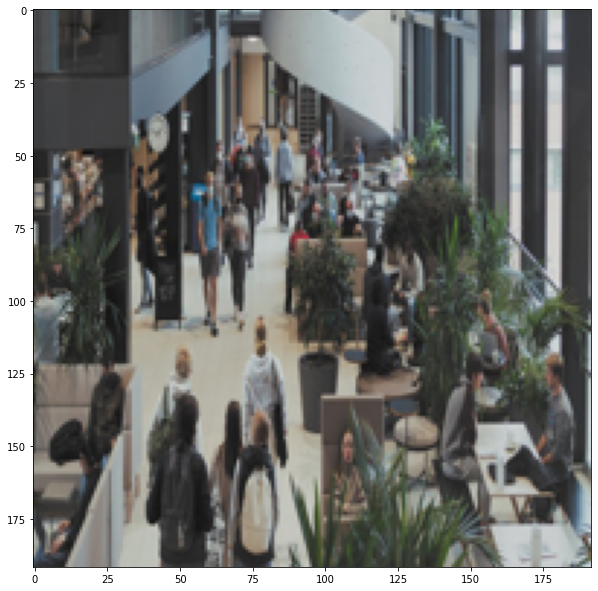

1/1 [==============================] - 1s 1s/step
20


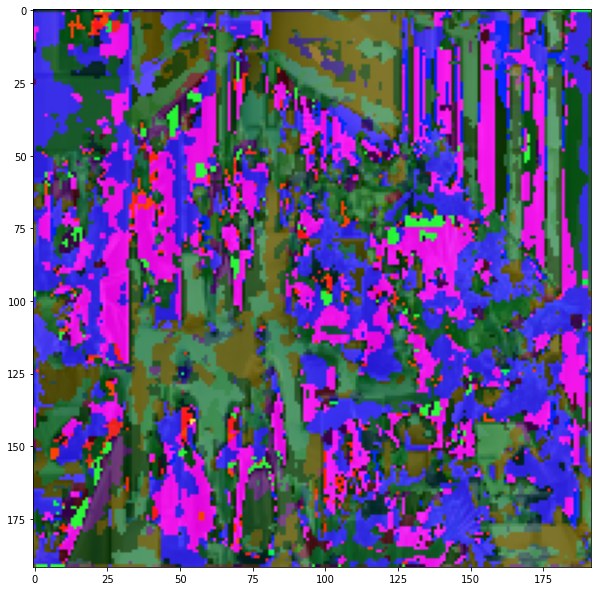

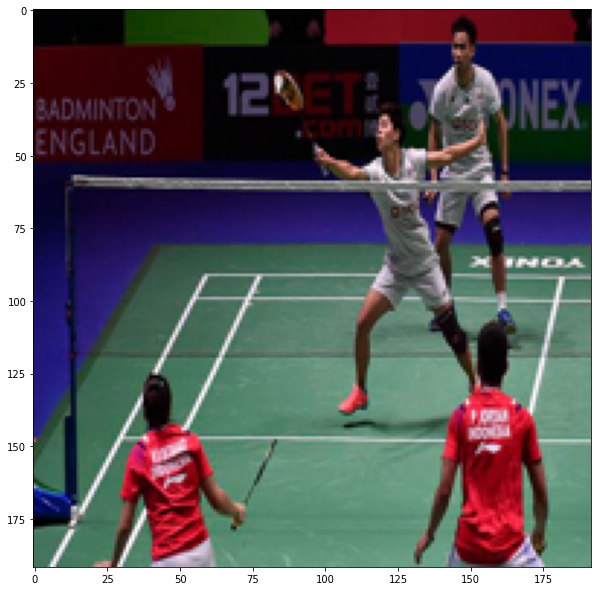

1/1 [==============================] - 1s 1s/step
20


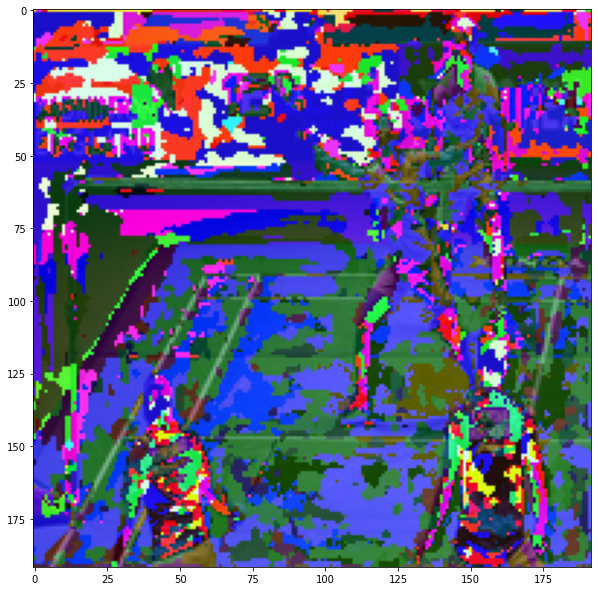

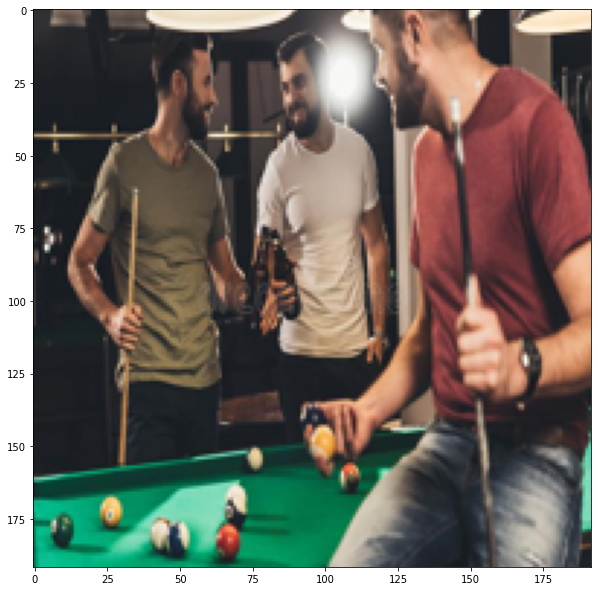

1/1 [==============================] - 1s 939ms/step
20


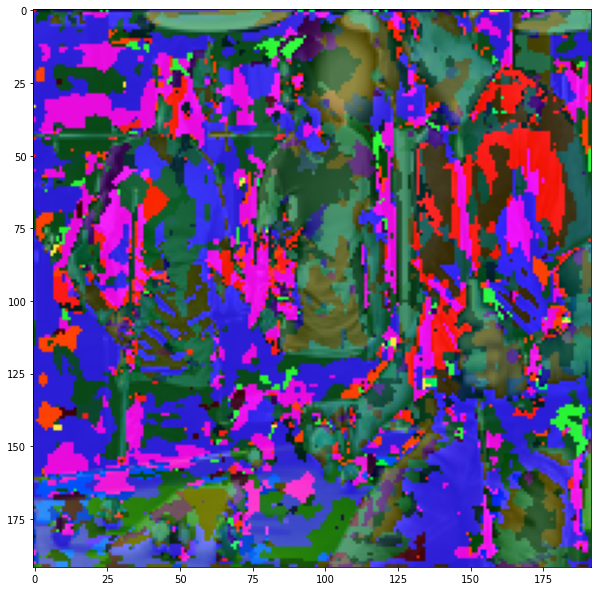

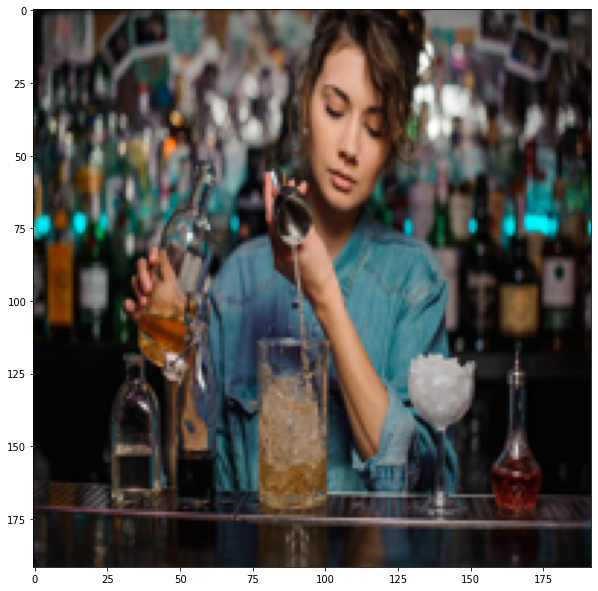

1/1 [==============================] - 1s 899ms/step
19


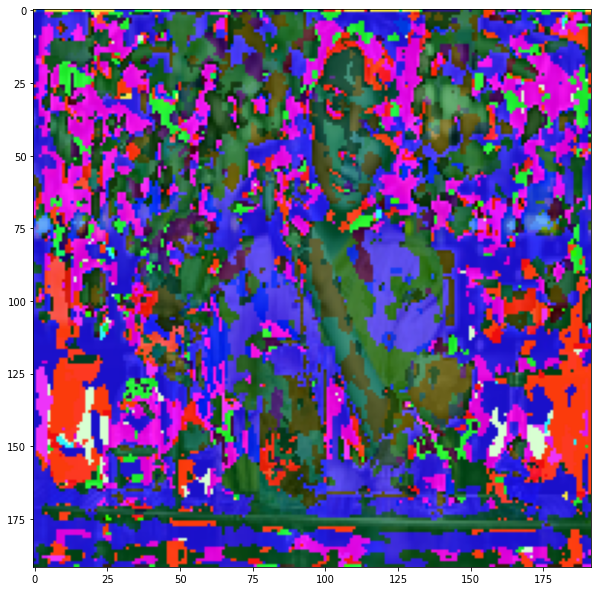

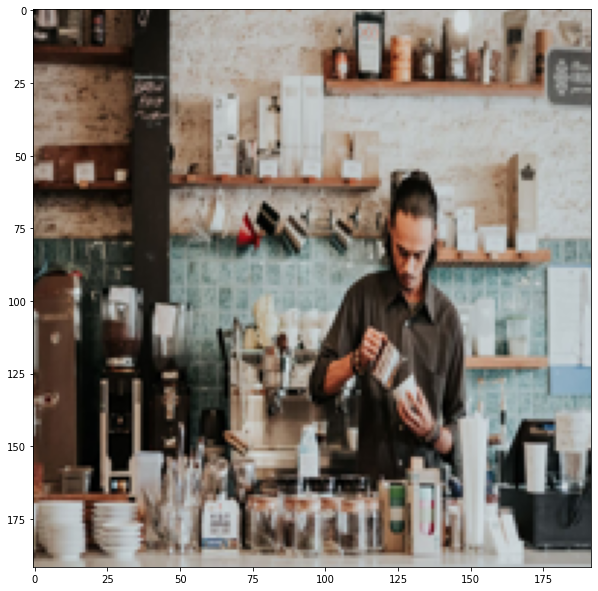

1/1 [==============================] - 2s 2s/step
20


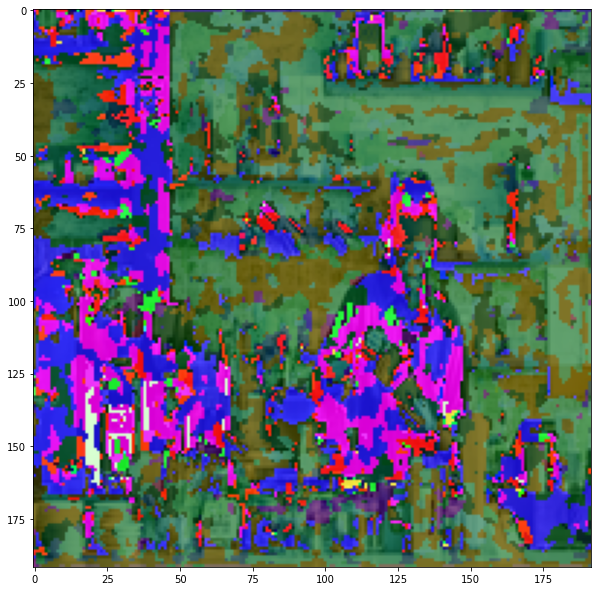

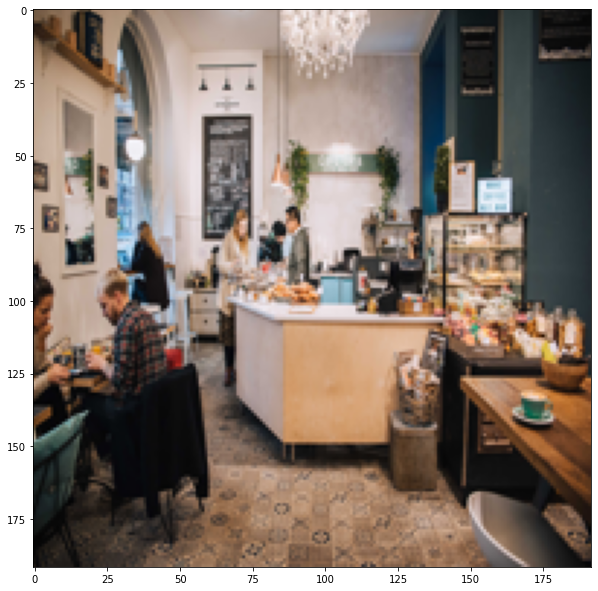

1/1 [==============================] - 2s 2s/step
20


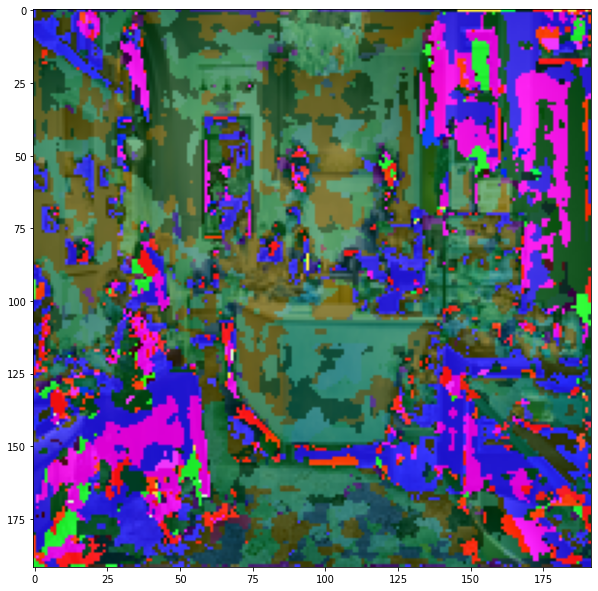

In [14]:
batch = load_images((192, 192))

model = sm.FPN('vgg16', encoder_weights='imagenet', input_shape=(192, 192, 3))
preprocess_input = sm.get_preprocessing('vgg16')

model.summary()

for img in batch:
  display_image(img[0])
  img = preprocess_input(img)
  pred = model.predict(img)[0]
  pr = pred.reshape((model.output_shape[1],  model.output_shape[2], model.output_shape[3])).argmax(axis=2)
  print(np.max(pr))
  out = visualize_segmentation(pr, img[0], n_classes)
  display_image(out)

In [11]:
batch = load_images((192, 192))

model = sm.PSPNet('resnet50', encoder_weights='imagenet', input_shape=(192, 192, 3))
preprocess_input = sm.get_preprocessing('vgg16')

model.summary()
n_classes = model.output_shape[3]

for img in batch:
  display_image(img[0])
  img = preprocess_input(img)
  pred = model.predict(img)[0]
  pr = pred.reshape((model.output_shape[1],  model.output_shape[2], model.output_shape[3])).argmax(axis=2)
  out = visualize_segmentation(pr, img[0], n_classes)
  display_image(out)

Output hidden; open in https://colab.research.google.com to view.

In [10]:
n_classes = model.output_shape[3]
print(n_classes)

21


In [26]:
print(pred.shape)

(1, 192, 192, 21)


In [12]:
for c in range(21):
  print(pr[:, :])
  print(c)
  print(pr[:, :] == c)
  break

[[12 12 12 ... 19 19 19]
 [12 12 12 ... 19 19 19]
 [12 12 12 ... 19 19 19]
 ...
 [12 12 12 ... 10 10 10]
 [12 12 12 ... 10 10 10]
 [12 12 12 ... 10 10 10]]
0
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


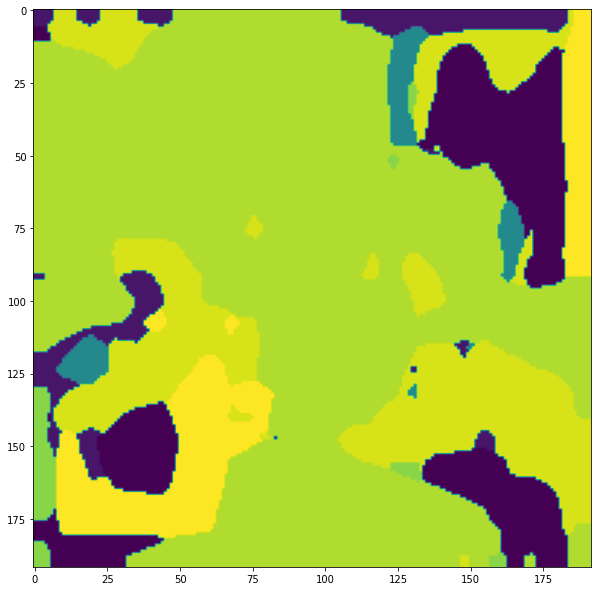

In [28]:
import cv2

pr = pred.reshape((model.output_shape[1],  model.output_shape[2], model.output_shape[3])).argmax(axis=2)
display_image(pr)